In [1]:
# Import the python library that connects to CoppeliaSim, the file is sim.py.
try:
    import sim
except:
    print('--------------------------------------------------------------')
    print('"sim.py" could not be imported. This means very probably that')
    print('either "sim.py" or the remoteApi library could not be found.')
    print('Make sure both are in the same folder as this file,')
    print('or appropriately adjust the file "sim.py"')
    print('--------------------------------------------------------------')
    print('')

import time

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
print('Program started')
sim.simxFinish(-1)  # just in case, close all opened connections
clientID = sim.simxStart('127.0.0.1', 19999, True, True, 5000, 5)  # Connect to CoppeliaSim

if clientID != -1:
    print('Connected to remote API server')

    # Now try to retrieve data in a blocking fashion (i.e. a service call):
    res, objs = sim.simxGetObjects(clientID, sim.sim_handle_all, sim.simx_opmode_blocking)

    # Before closing the connection to CoppeliaSim, make sure that the last command sent out had time to arrive. You can guarantee this with (for example):
    sim.simxGetPingTime(clientID)

    # Now close the connection to CoppeliaSim:
    sim.simxFinish(clientID)
else:
    print('Failed connecting to remote API server')
print('Program ended')

Program started
Connected to remote API server
Program ended


In [4]:
# Perfect sensor
def sense(x):
    return x

In [5]:
#Euler integration
def simulate(Δt, x, u):
    x += Δt * u
    return x

In [173]:
def control(t, y):
    
    ### WRITE YOUR CONTROL POLICY HERE:
    x = 2 * (-sin(t))
    y = cos(t)
    
    ux = cos(pi/6)*x - sin(pi/6)*y
    uy = sin(pi/6)*x + cos(pi/6)*y

    return array([ux, uy])

In [189]:
tf = 7.
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
p_x = (2*cos(0))
p_y = sin(0)
px = cos(pi/6)*p_x - sin(pi/6)*p_y + 3
py = sin(pi/6)*p_x + cos(pi/6)*p_y + 2
x = array([px, py])
x_log = [copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

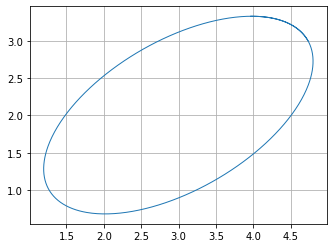

In [190]:
grid()
gca().set_aspect("equal")
plot(x_log[:,0], x_log[:,1],linewidth=1)

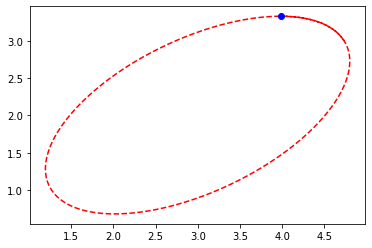

In [191]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())